In [78]:
import os
import time
import numpy as np
import pandas as pd
from importlib import reload
import matplotlib.pyplot as plt
from pathlib import Path
from skimage import io as skio
from aicsimageio import AICSImage, writers
plt.rcParams['svg.fonttype'] = 'none'

from cell_shape_variation.steps.shapemode import plotting, avgshape
from cell_shape_variation.steps.analysis import analysis_tools as atools
from nuclear_shape_analysis_workflow.steps.make_feature_figures import make_feature_figures_utils as figtools

In [125]:
gene_to_struct =  {
 'FBL': 'nucleoli (DFC)',
 'NPM1': 'nucleoli (GC)',
 'SON': 'nuclear speckles',
 'SMC1A': 'cohesins',
 'HIST1H2BJ': 'histones',
 'LMNB1': 'nuclear envelope',
 'NUP153': 'nuclear pores',
 'SEC61B': 'ER (Sec61 beta)',
 'ATP2A2': 'ER (SERCA2)',
 'TOMM20': 'mitochondria',
 'SLC25A17': 'peroxisomes',
 'RAB5A': 'endosomes',
 'LAMP1': 'lysosomes',
 'ST6GAL1': 'Golgi',
 'CETN2': 'centrioles',
 'TUBA1B': 'microtubules',
 'AAVS1': 'plasma membrane',
 'ACTB': 'actin filaments',
 'ACTN1': 'actin bundles',
 'MYH10': 'actomyosin bundles',
 'CTNNB1': 'adherens junctions',
 'GJA1': 'gap junctions',
 'TJP1': 'tight junctions',
 'DSP': 'desmosomes',
 'PXN': 'matrix adhesions'
}

# Panel A

### Snapshots analysis

Read the manifets generated by the datastep workflow `nuclear-shape-analysis-workflow`

In [2]:
out = '/allen/aics/assay-dev/MicroscopyOtherData/Viana/projects/cell_shape_variation/local_staging/notebooks/fig_flatness'

In [3]:
path_to_csv = '/allen/aics/modeling/juliec/projects/nuclear-shape-analysis-workflow/local_staging/getcellfeatures/manifest.csv'
df_snap = pd.read_csv(path_to_csv, index_col=0)
print(f'CSV shape: {df_snap.shape}, last modified: {time.ctime(os.path.getctime(path_to_csv))}')
df_snap.tail(n=1)

CSV shape: (5703, 199), last modified: Mon Nov  2 19:21:44 2020


,structure_name,position,full_zstack,crop_raw,crop_seg,name_dict,roi,scale_micron,mitosis_2,label_img,...,STR_PC3,STR_PC4,STR_PC5,STR_PC6,STR_PC7,STR_PC8,Timepoint,Colony_Dataset,hull_area,Binary_Size
1341,lamin_pred_100x,NaN,img_S4C0_TP0144,NaN,/allen/aics/assay-dev/MicroscopyOtherData/Vian...,"{'crop_raw': ['na'], 'crop_seg': ['struct_segm...","[43, 121, 67, 250, 3759, 3866]","[0.108, 0.108, 0.108]",M0,/allen/aics/assay-dev/MicroscopyOtherData/Vian...,...,4.331009,0.875865,-0.972368,-1.030862,0.181063,0.259412,12.0,20190620_R02_img_S4C0,169156.699272,Large


{'colony_scatter_by_height': PosixPath('/allen/aics/assay-dev/MicroscopyOtherData/Viana/projects/cell_shape_variation/local_staging/notebooks/fig_flatness/colony_scatter_by_height.png')}

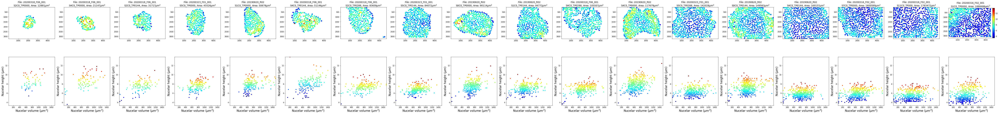

In [4]:
reload(figtools)
%matplotlib inline
figtools.make_colony_scatter_by_height_fig(savedir=Path(out), df=df_snap, svg=True)

{'binary_size_cutoff_116000_fig_by_colony_volume': PosixPath('/allen/aics/assay-dev/MicroscopyOtherData/Viana/projects/cell_shape_variation/local_staging/notebooks/fig_flatness/binary_size_cutoff_116000_fig_by_colony_volume.png'),
 'binary_size_cutoff_116000_fig_by_colony_height': PosixPath('/allen/aics/assay-dev/MicroscopyOtherData/Viana/projects/cell_shape_variation/local_staging/notebooks/fig_flatness/binary_size_cutoff_116000_fig_by_colony_height.png')}

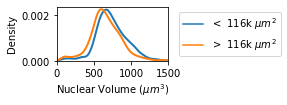

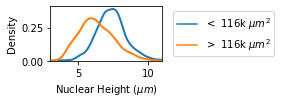

In [5]:
reload(figtools)
%matplotlib inline
figtools.make_kde_binary_size_figs(savedir=Path(out), df=df_snap, svg=True)

In [6]:
tmp = AICSImage('/allen/aics/modeling/juliec/projects/nuclear-shape-analysis-workflow/local_staging/collectoverviewdata/20200316_F02_001/data/midslice/img_S11C0.tif')
print(tmp.shape)

(1, 1, 284, 1, 1248, 1824)


In [7]:
skio.imsave('/allen/aics/modeling/juliec/projects/nuclear-shape-analysis-workflow/local_staging/collectoverviewdata/20200316_F02_001/data/midslice/img_S11C0_CORRECT.tif', tmp.data.squeeze()[0])

/home/matheus.viana/anaconda3/envs/variation/lib/python3.7/site-packages/ipykernel_launcher.py:1: UserWarning: /allen/aics/modeling/juliec/projects/nuclear-shape-analysis-workflow/local_staging/collectoverviewdata/20200316_F02_001/data/midslice/img_S11C0_CORRECT.tif is a low contrast image
  """Entry point for launching an IPython kernel.


# Read the pipeline data

Table resulting from the datastep workflow `cell_shape_variation`

In [136]:
staging_folder = 'local_staging'

path_to_csv = f'/allen/aics/assay-dev/MicroscopyOtherData/Viana/projects/cell_shape_variation/{staging_folder}/shapemode/manifest.csv'

df = pd.read_csv(path_to_csv, index_col=0)

print(f'CSV shape: {df.shape}, last modified: {time.ctime(os.path.getctime(path_to_csv))}')

/home/matheus.viana/anaconda3/envs/variation/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3063: DtypeWarning: Columns (31,35,37,42,43,44,46) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


CSV shape: (203764, 830), last modified: Fri Oct 30 15:13:51 2020


In [137]:
df['gene_name'] = df['structure_name']
df = df.replace({'structure_name': gene_to_struct})

# Panel B

Cell position relative to the center of the colonies

Number of input samples: 203764
Number of used for the plot: 104298
Proportion of samples kept: 51.2%
Min and max value for colors: 3 20


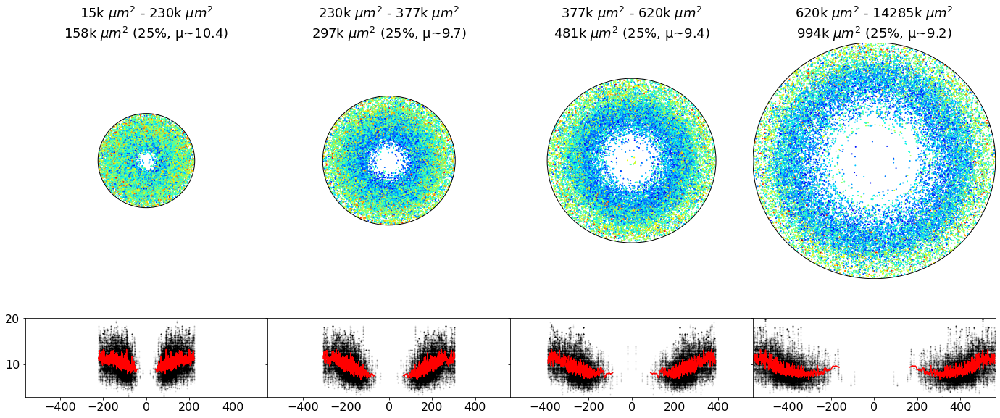

In [9]:
reload(atools)
%matplotlib inline

df_colony, pcts, df_filtered = atools.prepare_dataframe_for_colony_analysis(
    df_input = df,
    # filters_in = {'meta_imaging_mode': ['Mode C']},
    cvar = 'mem_position_depth_lcc',
    unit = 0.108,
    nbins = 4
)

atools.plot_template_colonies(
    df = df_colony,
    pcts = pcts,
    vmin = 3,
    vmax = 20,
    save = f'{out}/circular_colonies_ABC.png')

Number of input samples: 203764
Number of used for the plot: 104298
Proportion of samples kept: 51.2%
Min and max value for colors: -20.89553114046459 20.89553114046459


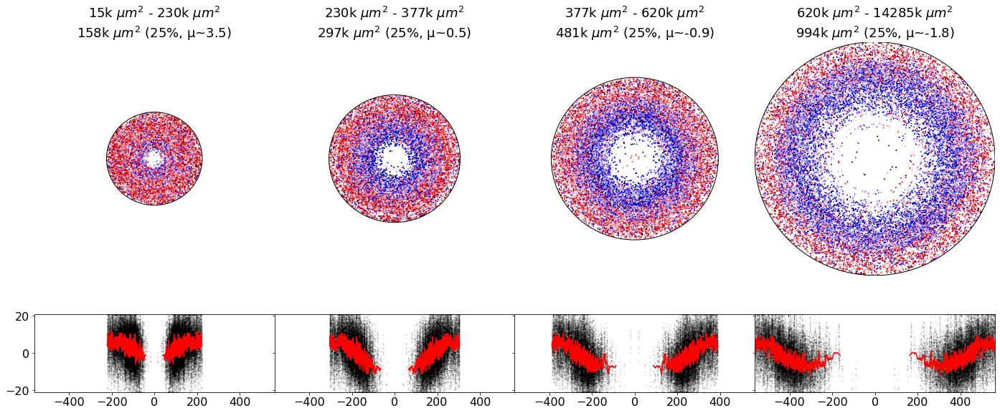

Number of input samples: 203764
Number of used for the plot: 104298
Proportion of samples kept: 51.2%
Min and max value for colors: -17.788534780910787 17.788534780910787


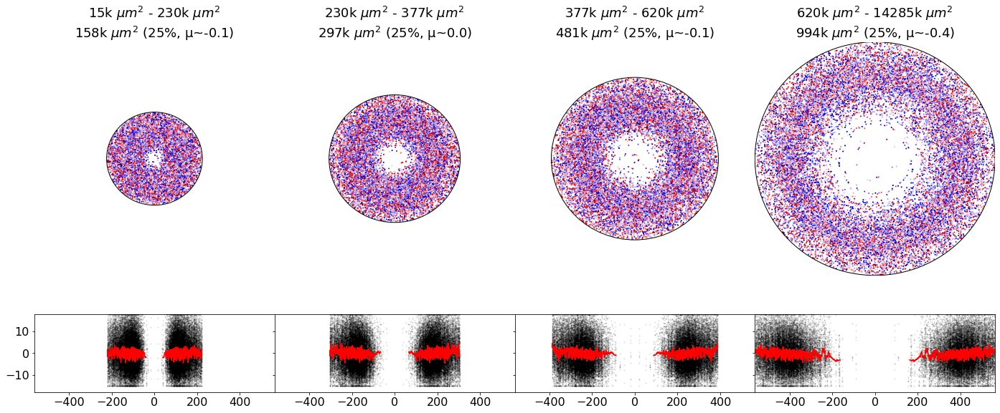

Number of input samples: 203764
Number of used for the plot: 104298
Proportion of samples kept: 51.2%
Min and max value for colors: -15.794252759706353 15.794252759706353


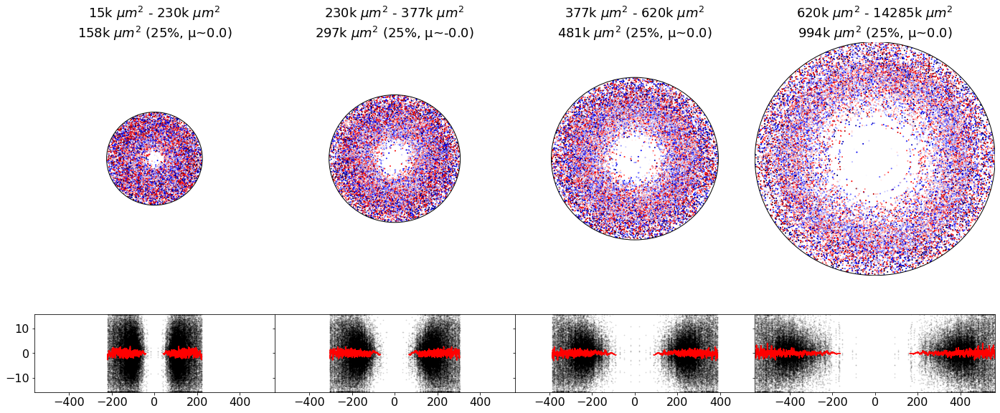

Number of input samples: 203764
Number of used for the plot: 104298
Proportion of samples kept: 51.2%
Min and max value for colors: -12.915596678720412 12.915596678720412


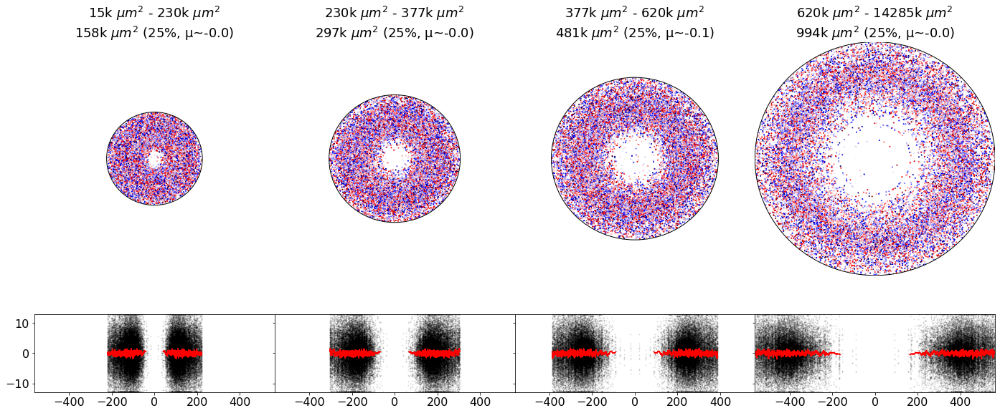

Number of input samples: 203764
Number of used for the plot: 104298
Proportion of samples kept: 51.2%
Min and max value for colors: -13.87476103775425 13.87476103775425


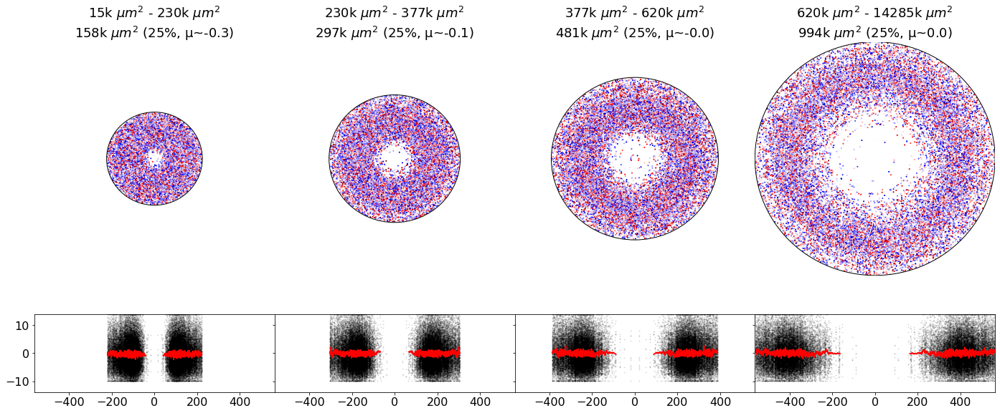

Number of input samples: 203764
Number of used for the plot: 104298
Proportion of samples kept: 51.2%
Min and max value for colors: -11.33724671341661 11.33724671341661


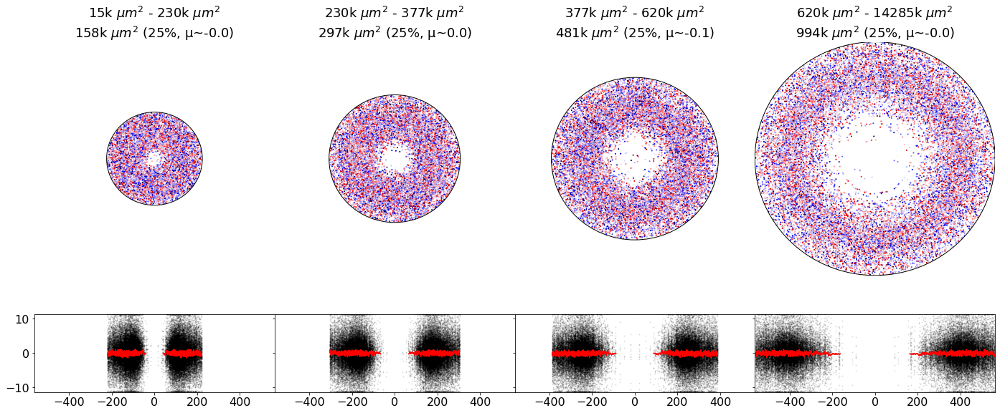

Number of input samples: 203764
Number of used for the plot: 104298
Proportion of samples kept: 51.2%
Min and max value for colors: -10.531842107965728 10.531842107965728


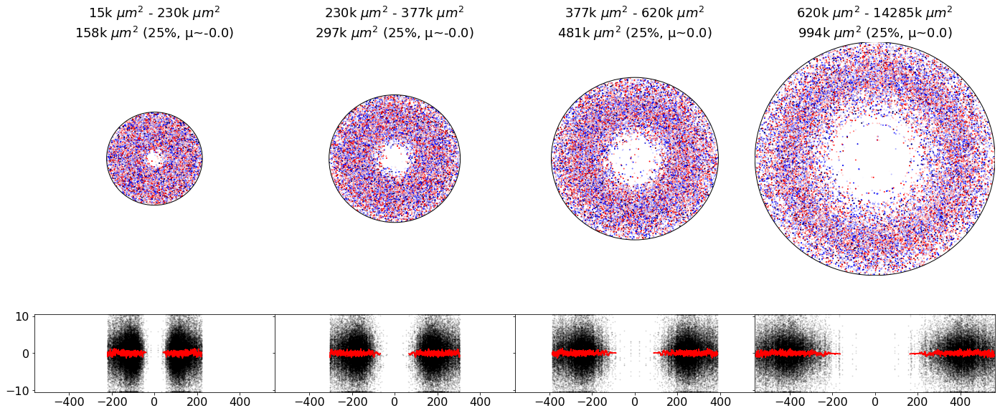

Number of input samples: 203764
Number of used for the plot: 104298
Proportion of samples kept: 51.2%
Min and max value for colors: -7.675228841080092 7.675228841080092


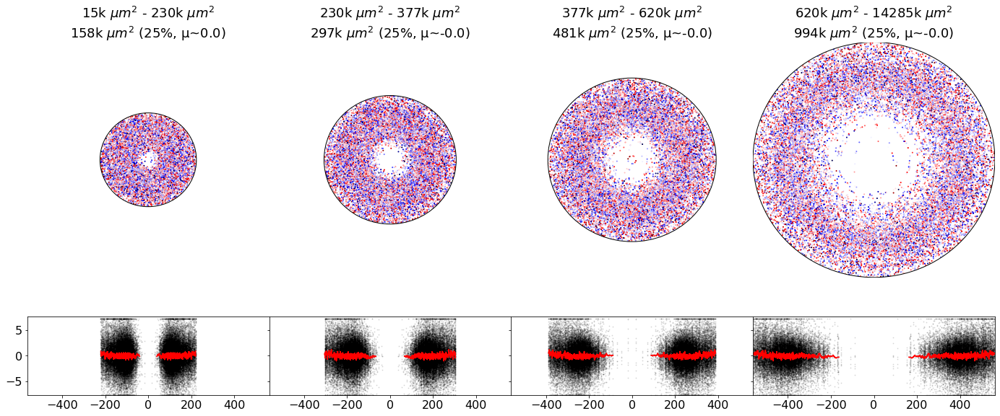

In [10]:
reload(atools)
%matplotlib inline

for i in range(1,9):

    df_colony, pcts, df_filtered = atools.prepare_dataframe_for_colony_analysis(
        df_input = df,
        cvar = f'DNA_MEM_PC{i}',
        unit = 1,
        nbins = 4
    )

    atools.plot_template_colonies(
        df = df_colony,
        pcts = pcts,
        cmap = 'seismic',
        force_symmetry = True,
        clip = 1,
        save = f'{out}/circular_colonies_PC{i}.png')

# Panel C

In [21]:
print(np.percentile(0.108*df_plot.mem_position_depth_lcc, [0.5,10,90,99.5]))
print(np.percentile(0.108*df_bkp.mem_position_depth_lcc, [0.5,10,90,99.5]))

[ 4.86   6.696 12.852 16.848]
[ 4.86   6.696 12.852 16.848]


(203764, 830)
(407528, 830)
Number of colors: 5
Data clips: 4.32 - 18.04
[All cell lines] - Qi: 6.70, Q1: 7.78, Q3: 11.23, Qs: 12.85


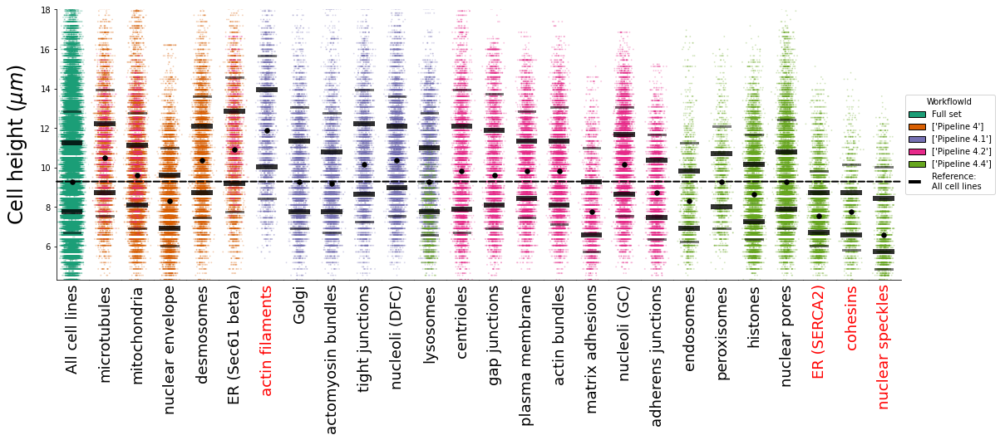

Number of colors: 5
Data clips: 801.41 - 4019.70
[All cell lines] - Qi: 1265.37, Q1: 1478.16, Q3: 2140.54, Qs: 2551.85


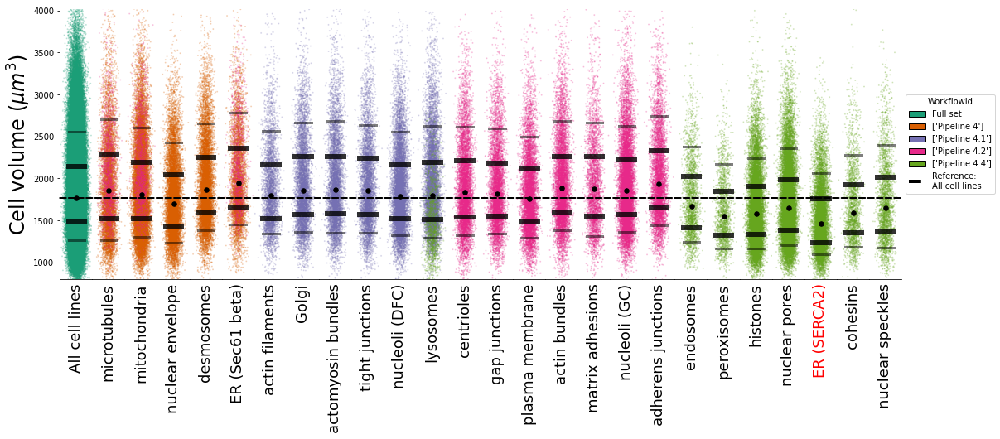

In [128]:
reload(plotting)
print(df.shape)

df_bkp = df.copy()
df_bkp['structure_name'] = 'All cell lines'
df_bkp['WorkflowId'] = 'Full set'
df_bkp['meta_fov_image_date'] = '2010-00-00 22:53:30.171'
df_bkp = df_bkp.reset_index()
df_bkp.CellId = 'D'+ str(df_bkp.CellId.values)
df_bkp = df_bkp.set_index('CellId')

df_plot = pd.concat([df,df_bkp], axis=0)

print(df_plot.shape)

plotting.vertical_distributions(
    df_input = df_plot,
    yvar = 'mem_position_depth_lcc',
    ylabel = 'Cell height ($\mu m$)',
    units = 0.108**1,
    factor = 'structure_name',
    sortby = ('meta_fov_image_date', 'min'),
    function = None,
    clip = [0.1,99.9],
    force_float = False,
    colorby = 'WorkflowId',
    color_fix = {'unknown': 'gray'},
    references = ['All cell lines'],
    highlight = 1,
    top_text = False,
    save = f'{out}/cell_height_distribution.png'
)

plotting.vertical_distributions(
    df_input = df_plot,
    yvar = 'mem_shape_volume_lcc',
    ylabel = 'Cell volume ($\mu m^3$)',
    units = 0.108**3,
    factor = 'structure_name',
    sortby = ('meta_fov_image_date', 'min'),
    function = None,
    clip = [0.1,99.9],
    force_float = False,
    colorby = 'WorkflowId',
    color_fix = {'unknown': 'gray'},
    references = ['All cell lines'],
    highlight = 1,
    top_text = False,
    save = f'{out}/cell_volume_distribution.png'
)


Number of colors: 5
Data clips: -26.59 - 26.01
[All cell lines] - Qi: -12.45, Q1: -6.70, Q3: 6.76, Qs: 12.35


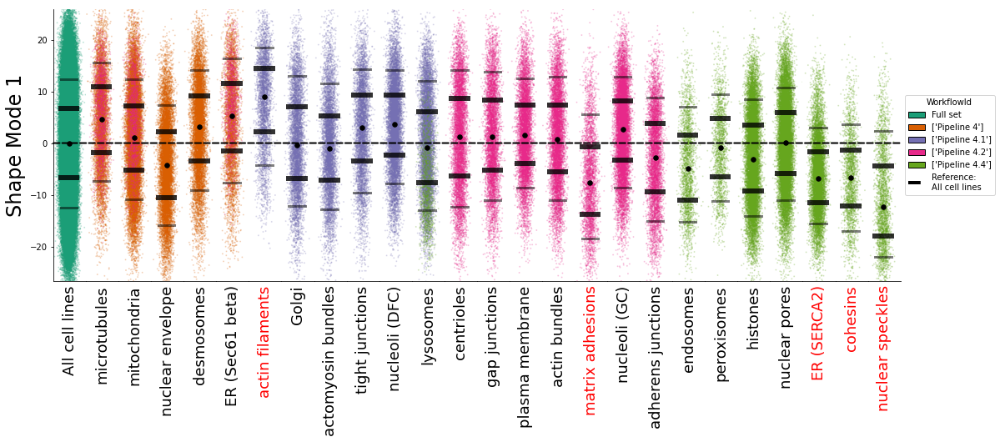

Number of colors: 5
Data clips: -19.56 - 24.73
[All cell lines] - Qi: -8.89, Q1: -5.18, Q3: 4.80, Qs: 9.84


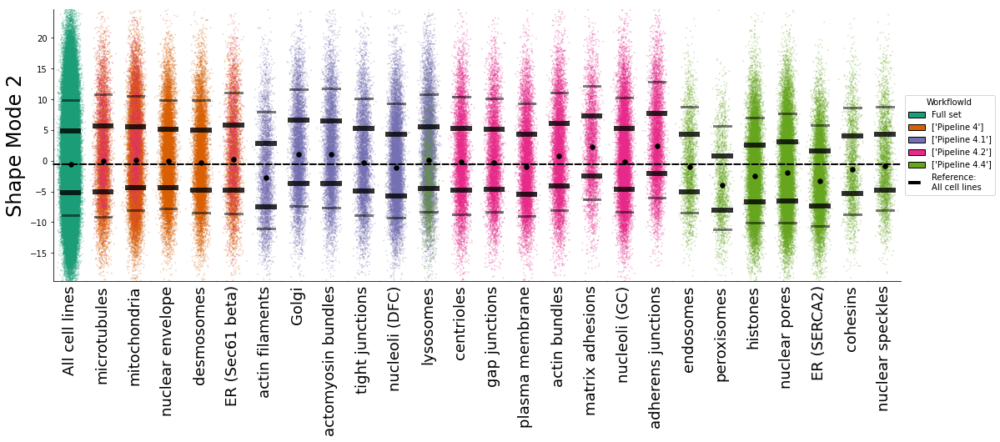

Number of colors: 5
Data clips: -19.85 - 19.83
[All cell lines] - Qi: -8.93, Q1: -4.39, Q3: 4.36, Qs: 8.96


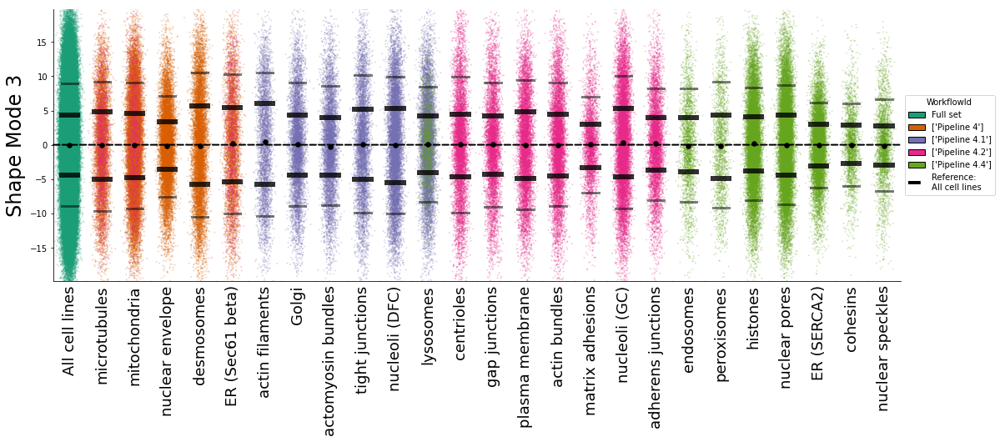

Number of colors: 5
Data clips: -17.35 - 17.47
[All cell lines] - Qi: -6.71, Q1: -3.41, Q3: 3.38, Qs: 6.81


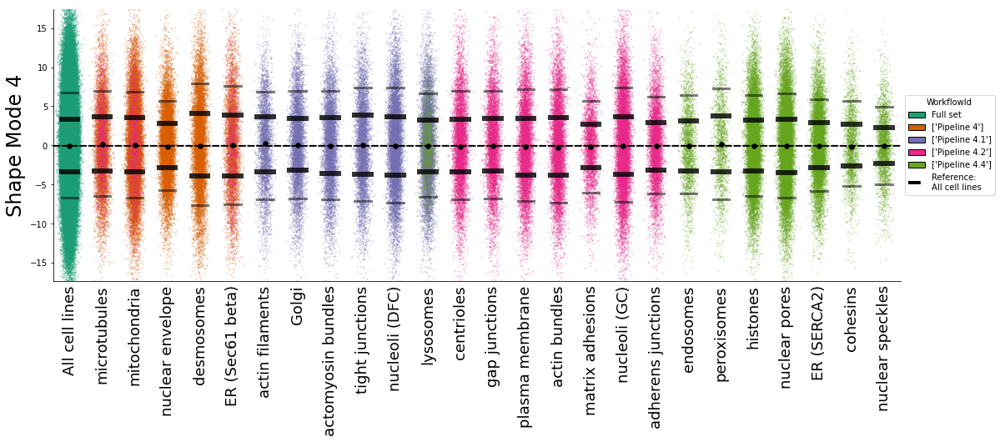

Number of colors: 5
Data clips: -12.21 - 19.63
[All cell lines] - Qi: -6.23, Q1: -3.78, Q3: 3.23, Qs: 6.98


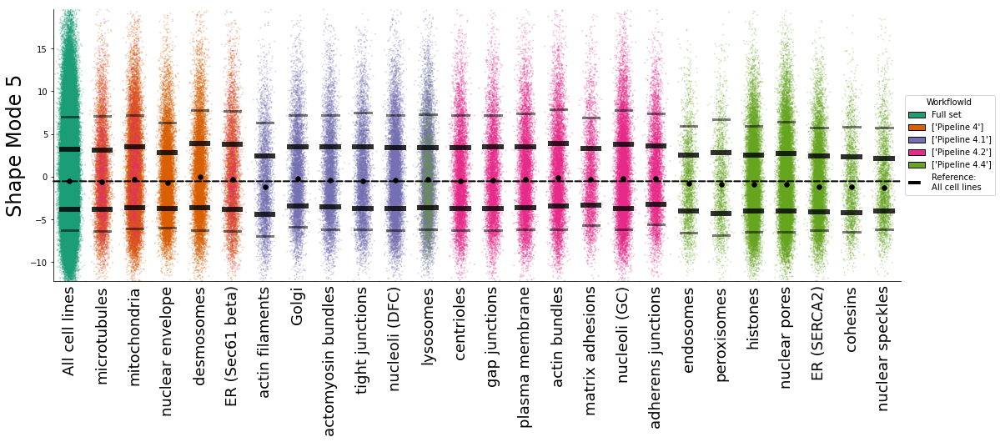

Number of colors: 5
Data clips: -17.22 - 17.41
[All cell lines] - Qi: -4.93, Q1: -2.34, Q3: 2.35, Qs: 4.91


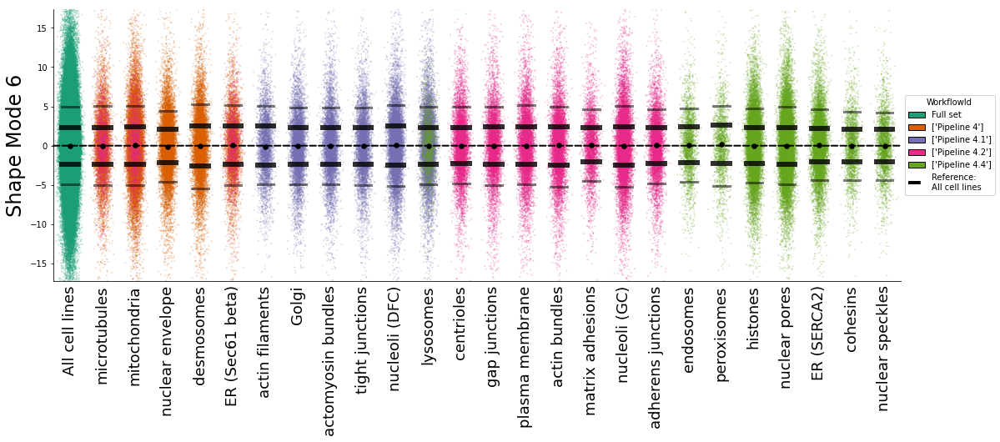

Number of colors: 5
Data clips: -15.48 - 15.54
[All cell lines] - Qi: -4.99, Q1: -2.47, Q3: 2.46, Qs: 4.99


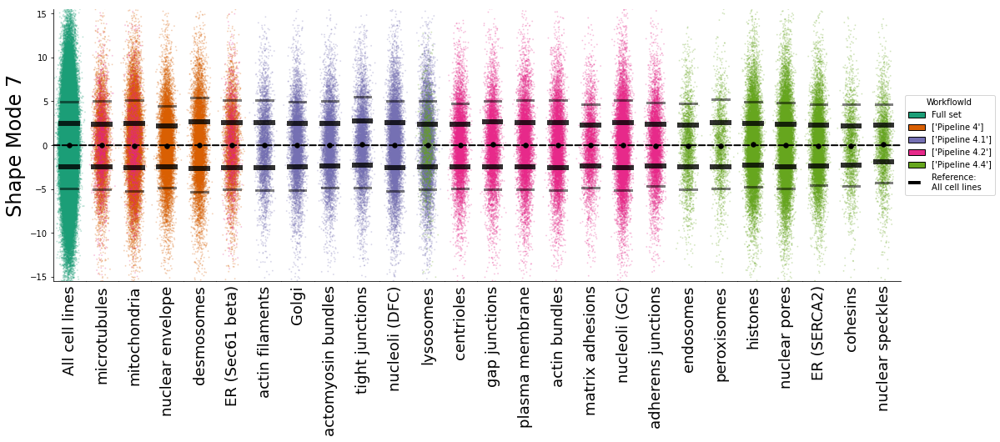

Number of colors: 5
Data clips: -12.80 - 14.10
[All cell lines] - Qi: -3.18, Q1: -1.53, Q3: 1.56, Qs: 3.14


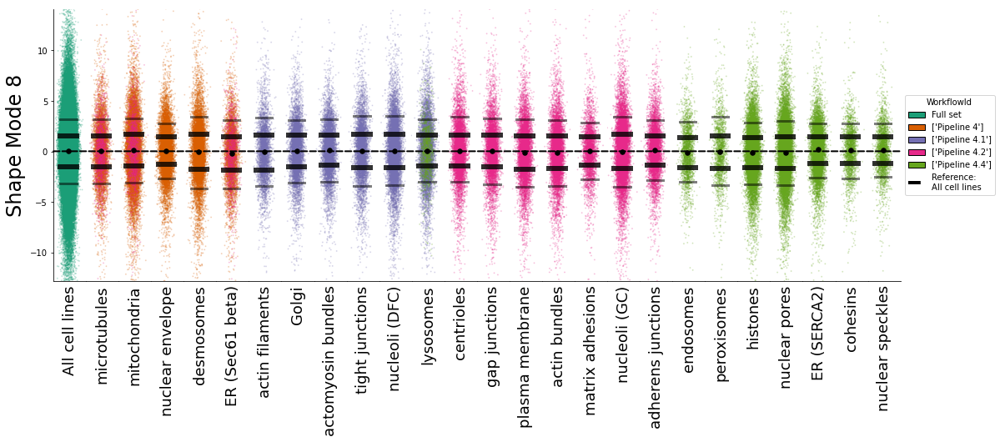

In [129]:
for i in range(1,9):
    plotting.vertical_distributions(
        df_input = df_plot,
        yvar = f'DNA_MEM_PC{i}',
        ylabel = f'Shape Mode {i}',
        units = 1,
        factor = 'structure_name',
        sortby = ('meta_fov_image_date', 'min'),
        function = None,
        clip = [0.1,99.9],
        force_float = False,
        colorby = 'WorkflowId',
        color_fix = {'unknown': 'gray'},
        references = ['All cell lines'],
        highlight = 1,
        top_text = False,
        save = f'{out}/cell_pc{i}_distribution.png'
    )

Number of colors: 5
Data clips: 7.70 - 804.62
[All cell lines] - Qi: 78.63, Q1: 124.43, Q3: 379.43, Qs: 635.01


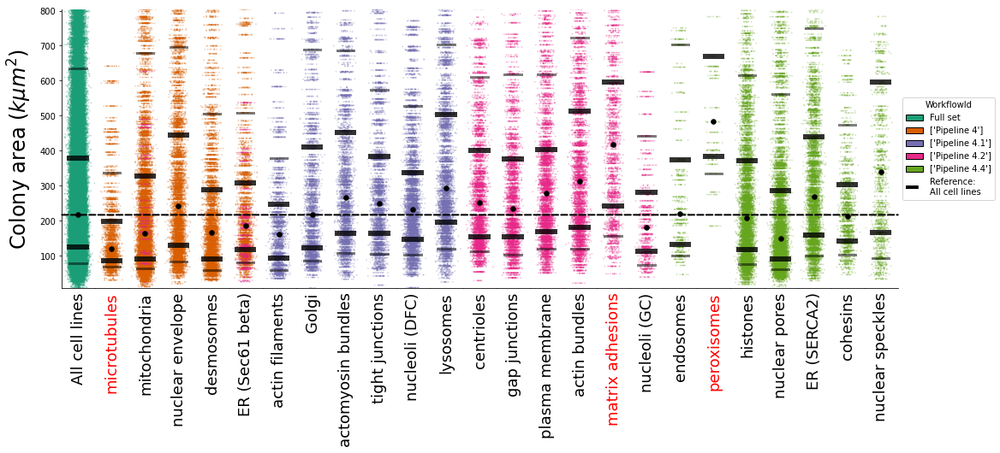

In [130]:
plotting.vertical_distributions(
    df_input = df_plot,
    yvar = 'meta_colony_area',
    ylabel = 'Colony area ($k \mu m^2$)',
    units = (1.08**2)*4*2/1000,
    factor = 'structure_name',
    sortby = ('meta_fov_image_date', 'min'),
    function = None,
    clip = [0.0,95],
    force_float = False,
    colorby = 'WorkflowId',
    color_fix = {'unknown': 'gray'},
    references = ['All cell lines'],
    highlight = 1,
    top_text = False,
    save = f'{out}/colony_area_distribution.png'
)

# Panel D

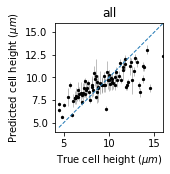

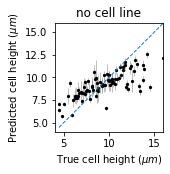

In [57]:
for model_folder, name in zip(['model_select_struc_all_modes_all_var','model_select_struc_all_modes_no_struc_var'],['all','no cell line']):
    df_lr = pd.read_csv(f'/allen/aics/microscopy/Data/fov_in_colony/{model_folder}/bootstrap_targ_pred.csv', index_col=0)
    df_lr = df_lr.rename(columns={
        "rownames.val.": "fovid",
        "val..output_var..": "targ",
        "i": "iter",
        "y_pred": "pred"}
    )

    df_agg = df_lr.groupby('targ').agg(['mean','std']).reset_index()

    fig, ax = plt.subplots(1,1,figsize=(2,2))
    x = 0.108*df_agg.targ
    y = 0.108*df_agg[('pred','mean')]
    yerr = 0.108*df_agg[('pred','std')]
    xmin = x.min()
    xmax = x.max()
    ax.scatter(x,y,s=5,c='k')
    ax.errorbar(x,y,yerr=yerr, linestyle="None", color='gray', linewidth=0.5, zorder=0)
    ax.plot([xmin,xmax],[xmin,xmax],'--', linewidth=1)
    ax.set_xlim(4,16)
    ax.set_ylim(4,16)
    ax.set_xlabel('True cell height ($\mu m$)')
    ax.set_ylabel('Predicted cell height ($\mu m$)')
    ax.set_aspect('equal')
    ax.set_title(name)
    plt.savefig(f'{out}/{model_folder}.svg', bbox_inches='tight')
    plt.show()

# Panel E

Toy model

In [14]:
reload(atools)
df = atools.create_density_metrics(
    df = df,
    scale = 0.108
)

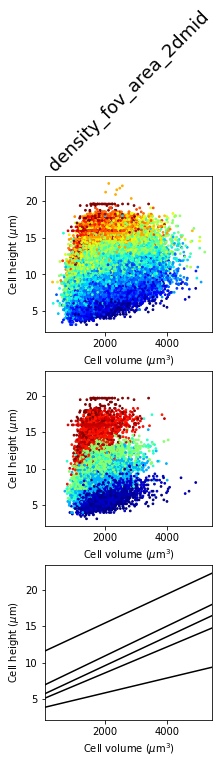

In [15]:
reload(atools)
%matplotlib inline

def curve(x, a, b):
    return a*x+b
def curve_eval(x, params):
    a = params[0]
    b = params[1]
    return curve(x,a,b)

_ = atools.color_coded_scatter_plot(
    df = df,
    varx = 'mem_shape_volume_lcc',
    labelx = 'Cell volume ($\mu$m$^3$)',
    vary = 'mem_position_depth_lcc',
    labely = 'Cell height ($\mu$m)',
    varsc = ['density_fov_area_2dmid'],
    clipc = 0.1,
    units = [0.108**3,0.108,1.0],
    bins = [128,[1,32,64,96,128]],
    save = f'{out}/density_scatter.png',
    service = None,
    display = True,
    function = (curve,curve_eval)
)

In [72]:
[f for f in df.columns if 'path' in f]

['fov_path',
 'fov_seg_path',
 'struct_seg_path',
 'meta_plate_path_segmentation',
 'meta_plate_path_mask']

In [99]:
'''
# TALL
v = 2000/(0.108**3)
h = 17/0.108
# SHORT
v = 3000/(0.108**3)
h = 7/0.108 
# MID
v = 2200/(0.108**3)
h = 12/0.108
'''
v = 3000/(0.108**3)
h = 8/0.108
print(v,h)
indexes = df.loc[
    (df.mem_shape_volume_lcc>(0.99*v))&
    (df.mem_shape_volume_lcc<(1.01*v))&
    (df.mem_position_depth_lcc>(0.99*h))&
    (df.mem_position_depth_lcc<(1.01*h))].index
print(len(indexes))
for index in indexes[1:2]:
    for col, name, ch,  in zip(['fov_seg_path','fov_path'],['nuc','mem'],[0,0]):
        print(f'Name: {col}, Path: {df.at[index,col]}')
#         stack = AICSImage(df.at[index,col]).data.squeeze()
#         img = stack[ch]
#         pcts = np.percentile(img, [5,95])
#         img = np.clip(img, *pcts)
#         img = (255.*(img-pcts[0])/(pcts[1]-pcts[0])).astype(np.uint8)
#         writer = writers.OmeTiffWriter(f'{out}/{name}-fov-{index}.tif', overwrite_file=True)
#         writer.save(img, dimension_order='ZYX')

2381496.723060509 74.07407407407408
2
Name: fov_seg_path, Path: /allen/programs/allencell/data/proj0/821/51d/fe0/725/1c7/bfa/042/c5b/e72/308/cd/3500001250_100X_20170829_1-Scene-02-P2-E04_CellNucSegCombined.ome.tiff
Name: fov_path, Path: /allen/programs/allencell/data/proj0/92a/e35/d2f/c79/370/e3b/c43/f1d/7da/7fb/e5/3500001250_100X_20170829_1-Scene-02-P2-E04.ome.tiff


### Supplemental

Pearson: 0.91


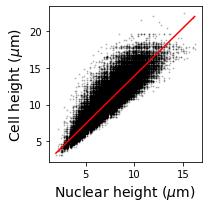

In [50]:
reload(atools)
%matplotlib inline

x = 0.108*df.dna_position_depth_lcc
y = 0.108*df.mem_position_depth_lcc

pc = np.corrcoef(x,y)[1,0]
print(f'Pearson: {pc:0.2}')

a, b = np.polyfit(x, y, 1)

fig, ax = plt.subplots(1,1, figsize=(3,3))
ax.scatter(x, y, s=1, c='k', alpha=0.2)
ax.set_xlabel('Nuclear height ($\mu$m)', fontsize=14)
ax.set_ylabel('Cell height ($\mu$m)', fontsize=14)
ax.plot([x.min(),x.max()],[a*x.min()+b,a*x.max()+b], 'r-')
plt.tight_layout()
plt.savefig(f'{out}/cell_nucleus_height.png', dpi=300)
plt.show()


In [48]:
df_full = pd.read_csv('/allen/aics/assay-dev/MicroscopyOtherData/Viana/resources/qcb/data-scripts/raw.csv', index_col=0)
print(df_full.shape)

(216457, 806)


In [63]:
df_myh10 = df_full.loc[
    (df_full.cell_stage=='M0')&
    (df_full.structure_name=='MYH10')&
    (df_full.meta_imaging_mode!='Mode D')
]
df_myh10.groupby(['WorkflowId','meta_imaging_mode']).size()

WorkflowId        meta_imaging_mode
['Pipeline 4.1']  Mode A               1418
                  Mode B               2566
                  Mode C               2239
['Pipeline 4.4']  Mode A                380
dtype: int64

Number of colors: 2
Data clips: 855.44 - 4652.01
[['Pipeline 4.1']] - Qi: 1356.54, Q1: 1576.47, Q3: 2267.62, Qs: 2685.79


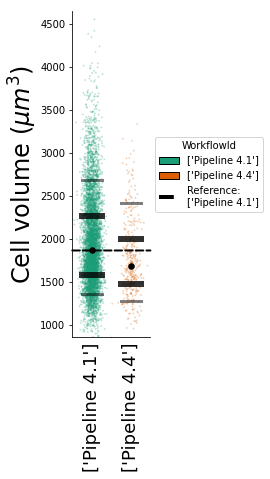

Number of colors: 2
Data clips: 4.00 - 18.04
[['Pipeline 4.1']] - Qi: 6.70, Q1: 7.78, Q3: 10.80, Qs: 12.74


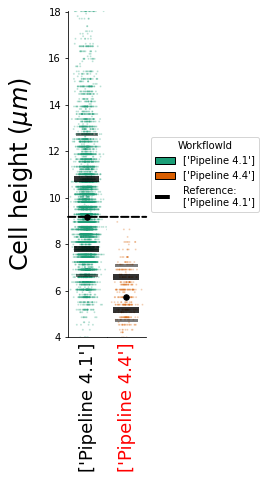

In [64]:
reload(plotting)
plotting.vertical_distributions(
    df_input = df_myh10,
    yvar = 'mem_shape_volume_lcc',
    ylabel = 'Cell volume ($\mu m^3$)',
    units = (0.108**3),
    factor = 'WorkflowId',
    sortby = ('meta_fov_image_date', 'min'),
    function = None,
    clip = [0.1,99.9],
    force_float = False,
    colorby = 'WorkflowId',
    color_fix = {'unknown': 'gray'},
    references = ["['Pipeline 4.1']"],
    highlight = 1,
    top_text = False,
    save = f'{out}/myh10_repeat_vol.png'
)

plotting.vertical_distributions(
    df_input = df_myh10,
    yvar = 'mem_position_depth_lcc',
    ylabel = 'Cell height ($\mu m$)',
    units = (0.108**1),
    factor = 'WorkflowId',
    sortby = ('meta_fov_image_date', 'min'),
    function = None,
    clip = [0.1,99.9],
    force_float = False,
    colorby = 'WorkflowId',
    color_fix = {'unknown': 'gray'},
    references = ["['Pipeline 4.1']"],
    highlight = 1,
    top_text = False,
    save = f'{out}/myh10_repeat_height.png'
)

# Piezo analysis

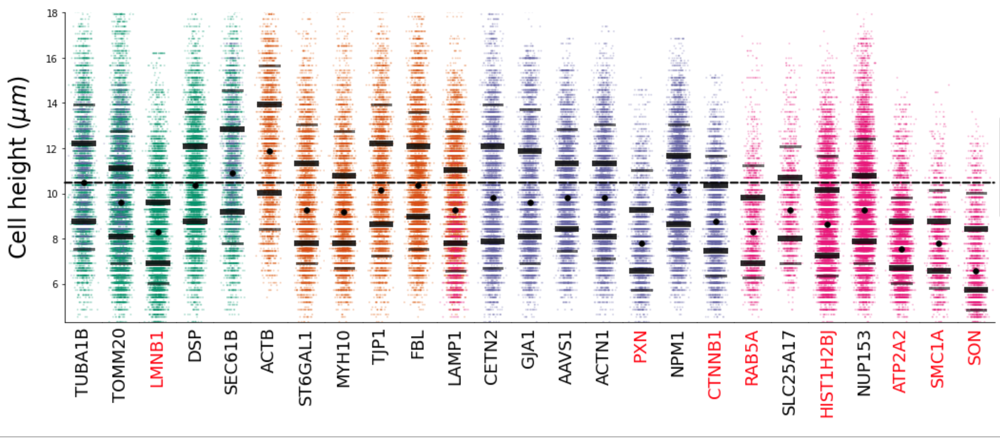

In [155]:
reload(plotting)
print(df.shape)

df_plot = df.copy()

rab5a_start = '2018-10-02 18:20:41.000'

df_plot.loc[df.meta_fov_image_date<rab5a_start,'piezo'] = 'Pre-Pipeline 4.4'

df_plot.loc[df.gene_name=='RAB5A','piezo'] = 'Pipeline 4.4, Old matrigel'
df_plot.loc[df.gene_name=='SLC25A17','piezo'] = 'Pipeline 4.4, Old matrigel'
df_plot.loc[df.gene_name=='HIST1H2BJ','piezo'] = 'Pipeline 4.4, Old matrigel'
df_plot.loc[df.gene_name=='NUP153','piezo'] = 'Pipeline 4.4, Old matrigel'
df_plot.loc[df.gene_name=='ATP2A2','piezo'] = 'Pipeline 4.4, Old matrigel'
df_plot.loc[df.gene_name=='SMC1A','piezo'] = 'Pipeline 4.4, New matrigel'
df_plot.loc[df.gene_name=='SON','piezo'] = 'Pipeline 4.4, New matrigel'
df_plot.loc[(df.gene_name=='LAMP1')&(df.WorkflowId=="['Pipeline 4.4']"),'piezo'] = 'Pipeline 4.4, New matrigel'

print(df_plot.groupby(['gene_name','piezo'], dropna=False).size())
print(df_plot.groupby(['piezo'], dropna=False).size())

(203764, 831)
gene_name  piezo                     
AAVS1      Pre-Pipeline 4.4               7668
ACTB       Pre-Pipeline 4.4               3824
ACTN1      Pre-Pipeline 4.4               7655
ATP2A2     Pipeline 4.4, Old matrigel     9709
CETN2      Pre-Pipeline 4.4               7126
CTNNB1     Pre-Pipeline 4.4               5842
DSP        Pre-Pipeline 4.4               9798
FBL        Pre-Pipeline 4.4               9950
GJA1       Pre-Pipeline 4.4               6173
HIST1H2BJ  Pipeline 4.4, Old matrigel    15091
LAMP1      Pipeline 4.4, New matrigel     1354
           Pre-Pipeline 4.4               8760
LMNB1      Pre-Pipeline 4.4              11863
MYH10      Pre-Pipeline 4.4               6207
NPM1       Pre-Pipeline 4.4              11817
NUP153     Pipeline 4.4, Old matrigel    17748
PXN        Pre-Pipeline 4.4               3488
RAB5A      Pipeline 4.4, Old matrigel     2411
SEC61B     Pre-Pipeline 4.4               6407
SLC25A17   Pipeline 4.4, Old matrigel     1853
SMC1A   

Average height for Pre-Pipeline 4.4 = 9.94µm
Average height for Pipeline 4.4, Old matrigel = 8.89µm
Average height for Pipeline 4.4, New matrigel = 7.45µm
Cells in old matrigel are 10.56% smaller
Number of colors: 3
Data clips: 4.32 - 18.04
[Pre-Pipeline 4.4] - Qi: 6.91, Q1: 8.10, Q3: 11.56, Qs: 13.28


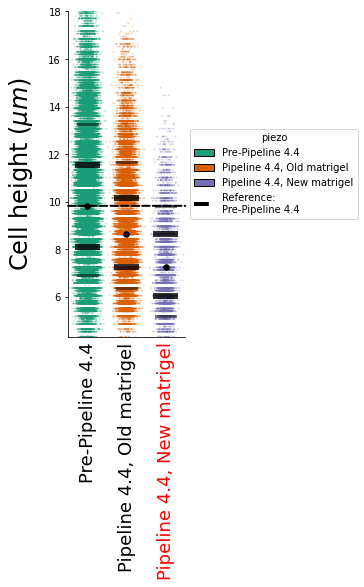

Number of colors: 5
Data clips: 4.47 - 18.25
[All cell lines] - Qi: 6.91, Q1: 8.10, Q3: 11.35, Qs: 13.18


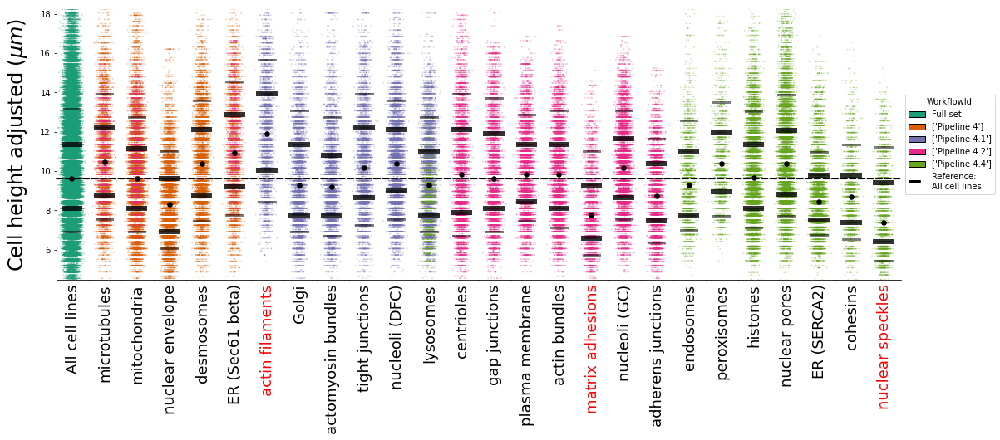

In [156]:
for g in df_plot.piezo.unique():
    avgh = 0.108*df_plot.loc[df_plot.piezo==g,'mem_position_depth_lcc'].mean()
    print(f'Average height for {g} = {avgh:0.2f}µm')
piezo_factor = 8.89/9.94
print(f'Cells in old matrigel are {(1-piezo_factor)*100:0.2f}% shorter')

plotting.vertical_distributions(
    df_input = df_plot,
    yvar = 'mem_position_depth_lcc',
    ylabel = 'Cell height ($\mu m$)',
    units = 0.108**1,
    factor = 'piezo',
    sortby = ('meta_fov_image_date', 'min'),
    function = None,
    clip = [0.1,99.9],
    force_float = False,
    colorby = 'piezo',
    color_fix = {'unknown': 'gray'},
    references = ['Pre-Pipeline 4.4'],
    highlight = 1,
    top_text = False,
    save = f'{out}/height_piezo.png'
)

df_plot['mem_position_depth_lcc_corrected'] = df_plot['mem_position_depth_lcc']
df_plot.loc[df_plot.piezo!='Pre-Pipeline 4.4','mem_position_depth_lcc_corrected'] /= piezo_factor

df_bkp = df_plot.copy()
df_bkp['structure_name'] = 'All cell lines'
df_bkp['WorkflowId'] = 'Full set'
df_bkp['meta_fov_image_date'] = '2010-00-00 22:53:30.171'
df_bkp = df_bkp.reset_index()
df_bkp.CellId = 'D'+ str(df_bkp.CellId.values)
df_bkp = df_bkp.set_index('CellId')

df_plot2 = pd.concat([df_plot,df_bkp], axis=0)

plotting.vertical_distributions(
    df_input = df_plot2,
    yvar = 'mem_position_depth_lcc_corrected',
    ylabel = 'Cell height adjusted ($\mu m$)',
    units = 0.108**1,
    factor = 'structure_name',
    sortby = ('meta_fov_image_date', 'min'),
    function = None,
    clip = [0.1,99.9],
    force_float = False,
    colorby = 'WorkflowId',
    color_fix = {'unknown': 'gray'},
    references = ['All cell lines'],
    highlight = 1,
    top_text = False,
    save = f'{out}/height_piezo_adjusted.png'
)

Average volume for Pre-Pipeline 4.4 = 1915.99µm^3
Average volume for Pipeline 4.4, Old matrigel = 1656.27µm^3
Average volume for Pipeline 4.4, New matrigel = 1658.70µm^3
Cells in old matrigel are 13.56% smaller
Number of colors: 3
Data clips: 801.45 - 4018.95
[Pre-Pipeline 4.4] - Qi: 1331.38, Q1: 1543.05, Q3: 2214.95, Qs: 2626.17


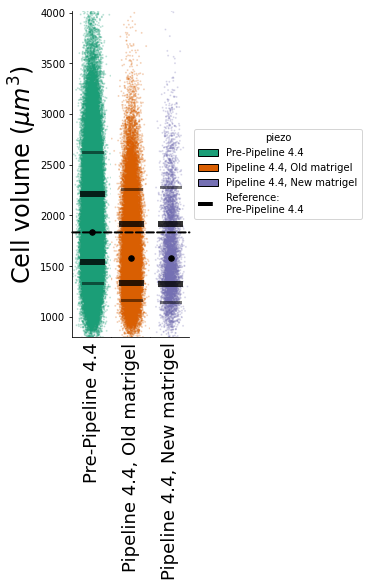

In [159]:
for g in df_plot.piezo.unique():
    avgv = (0.108**3)*df_plot.loc[df_plot.piezo==g,'mem_shape_volume_lcc'].mean()
    print(f'Average volume for {g} = {avgv:0.2f}µm^3')
piezo_vol_factor = 1656.27/1915.99
print(f'Cells in old matrigel are {(1-piezo_vol_factor)*100:0.2f}% smaller')

plotting.vertical_distributions(
    df_input = df_plot,
    yvar = 'mem_shape_volume_lcc',
    ylabel = 'Cell volume ($\mu m^3$)',
    units = 0.108**3,
    factor = 'piezo',
    sortby = ('meta_fov_image_date', 'min'),
    function = None,
    clip = [0.1,99.9],
    force_float = False,
    colorby = 'piezo',
    color_fix = {'unknown': 'gray'},
    references = ['Pre-Pipeline 4.4'],
    highlight = 1,
    top_text = False,
    save = f'{out}/vol_piezo.png'
)

# df_plot['mem_position_depth_lcc_corrected'] = df_plot['mem_position_depth_lcc']
# df_plot.loc[df_plot.piezo!='Pre-Pipeline 4.4','mem_position_depth_lcc_corrected'] /= piezo_vol_factor

# df_bkp = df_plot.copy()
# df_bkp['structure_name'] = 'All cell lines'
# df_bkp['WorkflowId'] = 'Full set'
# df_bkp['meta_fov_image_date'] = '2010-00-00 22:53:30.171'
# df_bkp = df_bkp.reset_index()
# df_bkp.CellId = 'D'+ str(df_bkp.CellId.values)
# df_bkp = df_bkp.set_index('CellId')

# df_plot2 = pd.concat([df_plot,df_bkp], axis=0)

# plotting.vertical_distributions(
#     df_input = df_plot2,
#     yvar = 'mem_position_depth_lcc_corrected',
#     ylabel = 'Cell height adjusted ($\mu m$)',
#     units = 0.108**1,
#     factor = 'structure_name',
#     sortby = ('meta_fov_image_date', 'min'),
#     function = None,
#     clip = [0.1,99.9],
#     force_float = False,
#     colorby = 'WorkflowId',
#     color_fix = {'unknown': 'gray'},
#     references = ['All cell lines'],
#     highlight = 1,
#     top_text = False,
#     save = f'{out}/height_piezo_adjusted.png'
# )

In [165]:
for i, f in enumerate(df.columns):
    if 'shcoeffs' not in f:
        print(f'{i:02d}: {f}')
    elif 'L0M0' in f:
        print(f'{i:02d}: {f}')

00: structure_name
01: pair
02: this_cell_nbr_complete
03: this_cell_nbr_dist_3d
04: this_cell_nbr_dist_2d
05: this_cell_nbr_overlap_area
06: roi
07: crop_raw
08: crop_seg
09: name_dict
10: scale_micron
11: edge_flag
12: FOVId
13: fov_path
14: fov_seg_path
15: struct_seg_path
16: this_cell_index
17: stack_min_z
18: stack_max_z
19: image_size
20: PlateId
21: meta_fov_position
22: ScopeId
23: WellId
24: well_name
25: passage
26: meta_imaging_mode
27: MitoticStateId
28: Complete
29: cell_stage
30: meta_fov_outside_overview
31: meta_fov_xcoord
32: meta_fov_ycoord
33: meta_fov_edgedist
34: meta_colony_touching_boundary
35: meta_colony_label
36: meta_colony_centroid
37: meta_colony_area_sum
38: meta_colony_count
39: meta_colony_area
40: meta_colony_diameter
41: meta_plate_bad_segmentation
42: meta_plate_path_segmentation
43: meta_plate_path_mask
44: meta_plate_confluency
45: SourceVialId
46: meta_well_passage_at_imaging
47: meta_well_passage_at_thaw
48: InstrumentId
49: WorkflowId
50: meta_f

In [174]:
qq=pd.read_csv('/allen/aics/assay-dev/MicroscopyOtherData/Viana/projects/cell_shape_variation/local_staging/shapemode/manifest_outliers.csv', index_col=0)

In [175]:
qq.shape

(204824, 3)

In [179]:
1060/204824*100

0.5175174784204977

In [178]:
qq.loc[qq.Outlier=='No'].shape

(203764, 3)

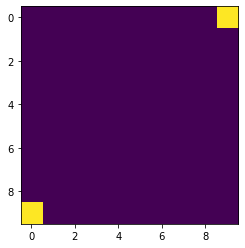

In [180]:
a=np.zeros((10,10))
a[0,-1]=1
a[-1,0]=1
plt.imshow(a)

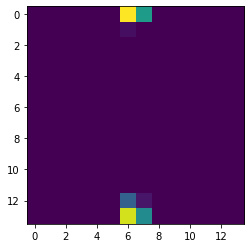

In [184]:
from skimage import transform
ar=transform.rotate(a,45,resize=True)
plt.imshow(ar)

In [185]:
nisos = [32,32]
iso_values = [0.0] + nisos
iso_values = np.cumsum(iso_values)
iso_values = iso_values / iso_values[-1]

In [186]:
iso_values

array([0. , 0.5, 1. ])

In [188]:
np.where(np.linspace(0.0,1.0,1+np.sum(nisos))==0.5)

(array([32]),)

In [189]:
!pwd

/allen/aics/assay-dev/MicroscopyOtherData/Viana/projects/cell_shape_variation/cell_shape_variation/notebooks
